In [1]:
!pip install scvelo
import numpy as np
import matplotlib.pyplot as pl
import scvelo as scv

scv.logging.print_version()

# the main tools we will be using is scVelo, a scalable toolkit for RNA velocity analysis in single cells

# created a scvtools package for the plotting functions
from scvtools import utils

Running scvelo 0.2.4 (python 3.9.9) on 2022-05-11 19:48.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


# Figure 1 Analysis

In [2]:
scv.settings.set_figure_params('scvelo', dpi_save=200, dpi=80, transparent=True, format='png')  # vectorized: pdf or svg
scv.settings.plot_prefix = 'scvelo_concept_'
scv.settings.verbosity = 2

kwargs = {'fontsize': 18, 'size': 200, 'linewidth': 3, 'use_raw': True,
          'legend_loc': 'none', 'colorbar': False, 'frameon': False, 'title': ''}

**Analysis**

RNA velocity posits a model of transcriptional dynamics For each gene, there is a given transcription rate, splicing rate (beta), and degradation rate (gamma)

Simulated mRNA metabolism with transcription, splicing and degradation. The parameters for each reaction are randomly sampled from a log-normal distribution and time events follow the Poisson law. The total time spent in a transcriptional state is varied between two and ten hours.

In [3]:
adata = scv.datasets.simulation(n_obs=500, t_max=25, beta=.3, gamma=.15, 
                                switches=[.5, .4, .3, .2], noise_level=1)
scv.tl.velocity(adata, mode='steady_state', vkey='steady_state_velocity', use_raw=True)

computing velocities
The correlation threshold has been reduced to -0.3586.
Please be cautious when interpreting results.
    finished (0:00:00)


**Note**

The docs are not entirely clear re: the implications of "switches" and "noise_level" in the above simulation function

In [4]:
basis = adata.var_names[1]

scv.tl.velocity(adata, mode='steady_state', vkey='steady_state_velocity', use_raw=True)
dm = scv.tl.recover_dynamics(adata, var_names=basis, use_raw=True, max_iter=100)

computing velocities
The correlation threshold has been reduced to -0.3586.
Please be cautious when interpreting results.
    finished (0:00:00)
recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: 1


saving figure to file ./figures/scvelo_concept_1.png


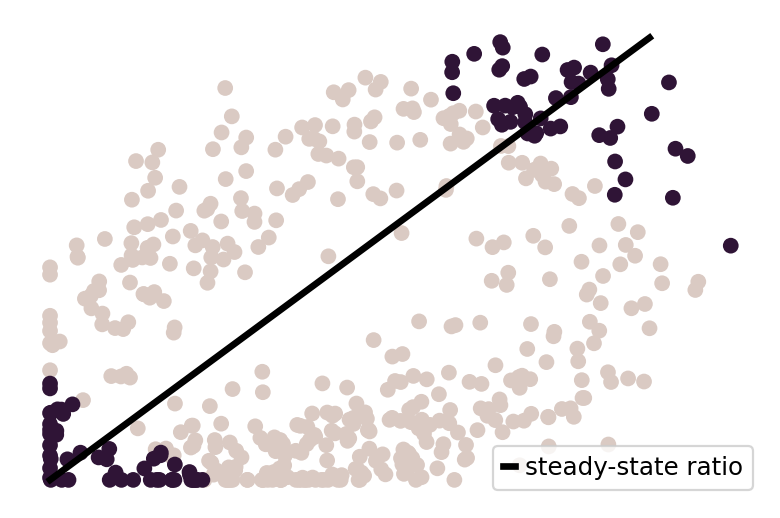

saving figure to file ./figures/scvelo_concept_2.png


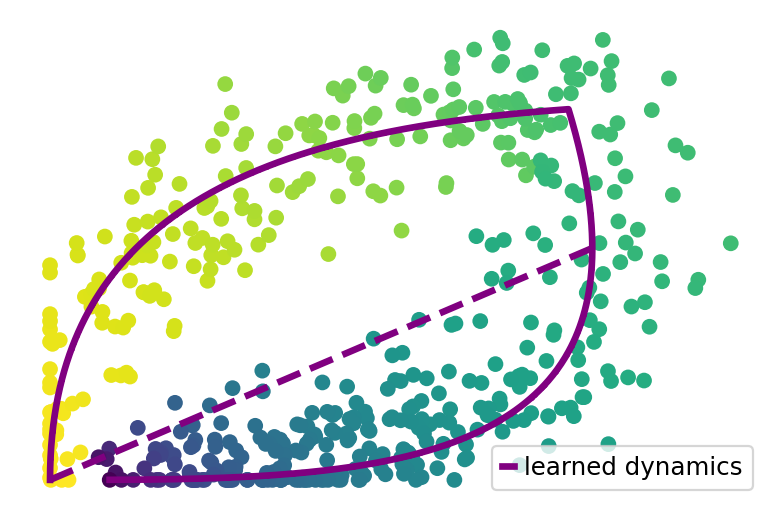

In [5]:
adata.obs['ss_weights'] = scv.utils.get_weight(adata[:, basis].layers['spliced'], 
                                               adata[:, basis].layers['unspliced'], perc=[10, 90]) * 1.01


scv.pl.scatter(adata, basis=basis, vkey='steady_state_velocity', color='ss_weights', 
               color_map='twilight_shifted', vmin=-0.5, vmax=0.4, **kwargs, save='1')
scv.pl.scatter(adata, basis=basis, vkey='dynamics', color='fit_t', color_map='viridis_r', **kwargs, save='2')

computing velocities
The correlation threshold has been reduced to -0.3586.
Please be cautious when interpreting results.
    finished (0:00:00)


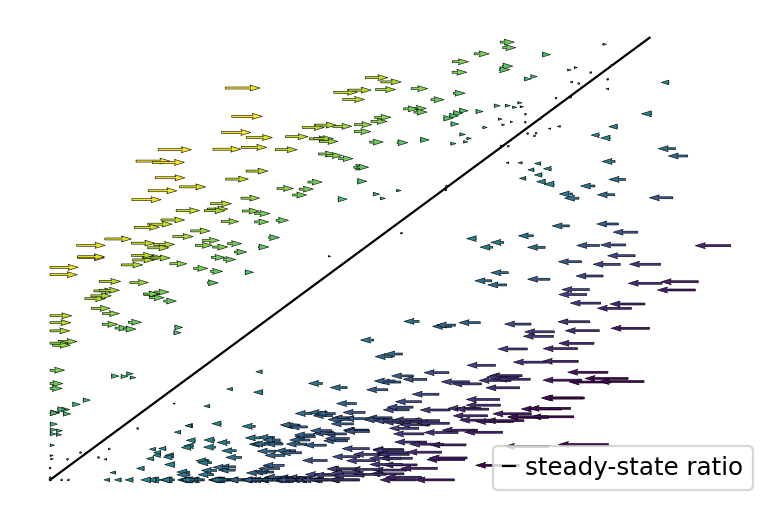

recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: 1
computing velocities
    finished (0:00:00)
saving figure to file ./figures/scvelo_concept_3.png


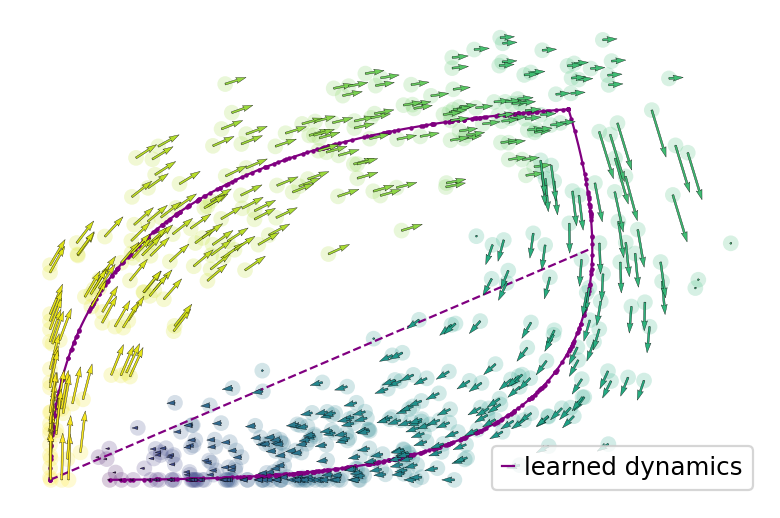

In [6]:
v_kwargs = {'vkey': 'steady_state_velocity', 'use_raw': True}
kwargs = {'size': 1, 'frameon': False, 'legend_loc': 'none', 'title': '', 'linewidth': .25, 'colorbar': False}

scv.tl.velocity(adata, mode='steady_state', **v_kwargs)
scv.pl.velocity_embedding(adata, basis=basis, color='steady_state_velocity', 
                          color_map='viridis', **v_kwargs, **kwargs)


dm = scv.tl.recover_dynamics(adata, var_names=basis, use_raw=True, max_iter=100)

scv.tl.velocity(adata, mode='dynamical', use_raw=True)

v_kwargs={'vkey': 'velocity', 'size': 200, 'frameon': False, 'title': '',
          'legend_loc': 'none', 'linewidth': .15, 'colorbar': False}


ax = scv.pl.scatter(adata, basis=basis, vkey='dynamics', size=1, use_raw=True, 
                    legend_loc='none', linewidth=1, show=False)

scv.pl.velocity_embedding(adata, basis=basis, color='fit_t', color_map='viridis_r', 
                          use_raw=True, **v_kwargs, ax=ax, save='3')

recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: 1
saving figure to file ./figures/scvelo_concept_5.png


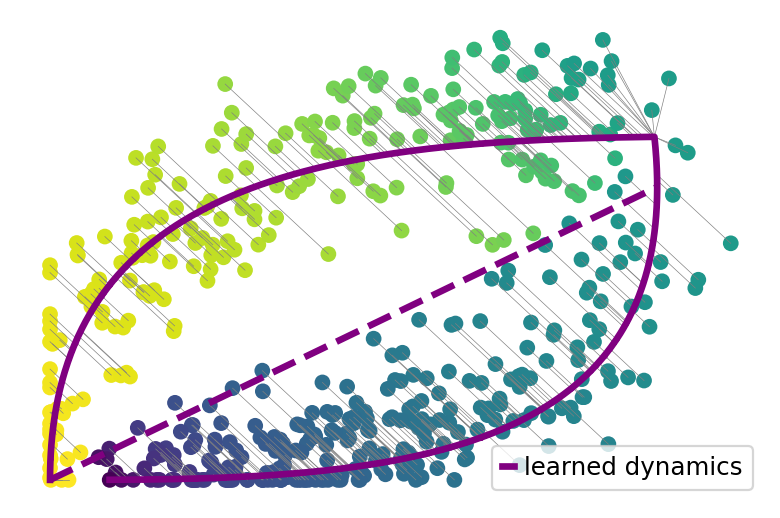

In [11]:
dm = scv.tl.recover_dynamics(adata, var_names=basis, max_iter=2, use_raw=True)

kwargs = {'fontsize': 18, 'size': 200, 'linewidth': 3, 'use_raw': True,
          'legend_loc': 'none', 'colorbar': False, 'frameon': False, 'title': ''}

scv.pl.scatter(adata, basis=basis, vkey='dynamics', color='fit_t', color_map='viridis_r', 
               show_assignments=True, **kwargs, save='5')

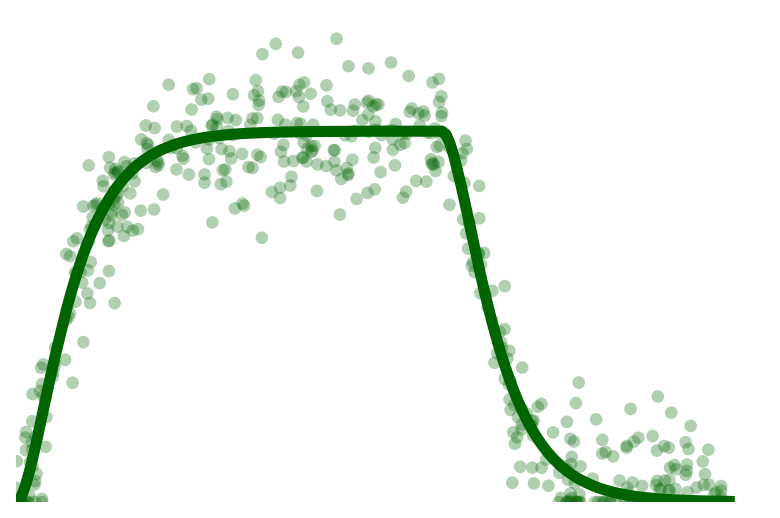

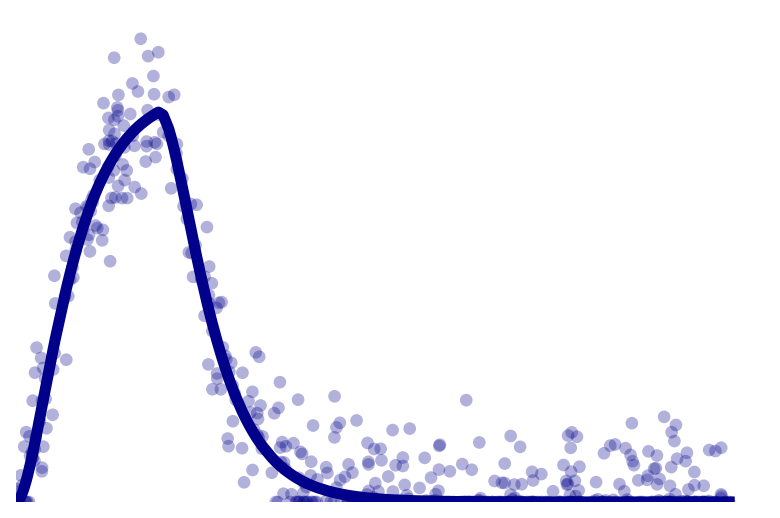

In [12]:
bdata = scv.datasets.simulation(n_obs=500, t_max=120, beta=.3, gamma=.15, switches=[.6, .2], noise_level=1)

sim_kwargs = {'ykey': 'spliced', 'linewidth': 5, 'legend_loc': 'none', 'frameon': False}
scv.pl.simulation(bdata, var_names=bdata.var_names[0], colors=['darkgreen'], **sim_kwargs)
scv.pl.simulation(bdata, var_names=bdata.var_names[1], colors=['darkblue'],  **sim_kwargs)

recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: 1


<AxesSubplot:xlabel='spliced', ylabel='unspliced'>

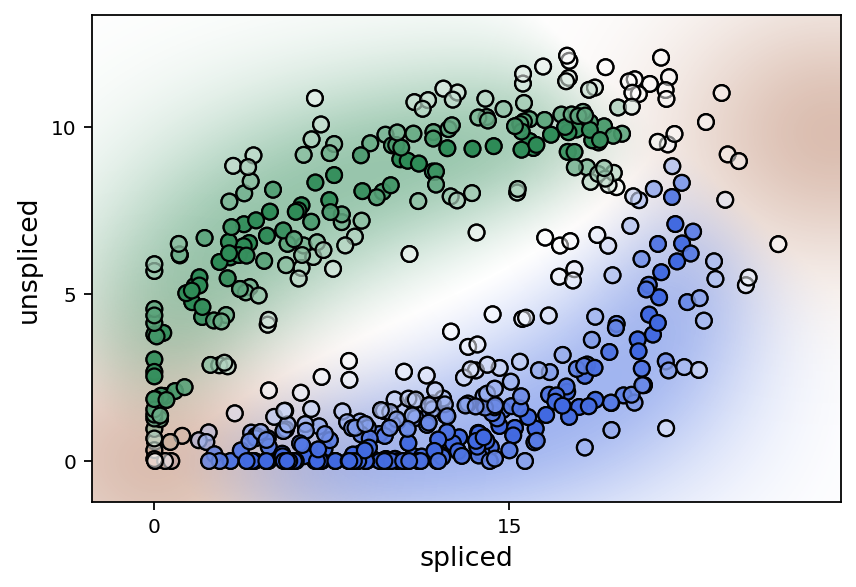

In [13]:
dm = scv.tl.recover_dynamics(adata, var_names=basis, use_raw=True)
dm.plot_state_likelihoods(continuous=True)

## Figure 2

In [15]:
!pip install -U scvelo
!pip install python-igraph louvain # we need in environment
!pip install velocyto # we need in environment
!pip install gprofiler-official # we need in environment

In [17]:
scv.settings.set_figure_params('scvelo', dpi_save=200, dpi=80, transparent=True, format='png')
scv.settings.plot_prefix = 'scvelo_dentate_gyrus_dataset_'
scv.settings.verbosity = 2

In [18]:
# lets load the dentategyrus datasets
dentategyrus = scv.datasets.dentategyrus()

**Analysis**

Preprocess the data and determine tunable parameters. In practice, this is an exploratory process, and highly specific to a given dataset and underlying question.

Setting the minimum number of cells required to be expressed (both spliced and unspliced transcripts) to 20 and the number of genes to keep to 2000

Computing the moments for velocity estimation. 1st/2nd order moments are computer, for each cell, across its nearest neighbors. The neighbor graph is obtained from euclidean distances in PCA space. Here, the number of neighbors to use is set to 30, and the number of principal components is set to 20.

In [19]:
scv.pp.filter_and_normalize(dentategyrus, min_shared_cells=20, n_top_genes=2000)
scv.pp.moments(dentategyrus, n_neighbors=30, n_pcs=30)

Filtered out 11835 genes that are detected in less than 20 cells (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:07)
computing moments based on connectivities
    finished (0:00:00)


In [21]:
scv.tl.velocity(dentategyrus, vkey='steady_state_velocity', mode='steady_state')
scv.tl.velocity_graph(dentategyrus, vkey='steady_state_velocity')

scv.tl.velocity(dentategyrus, vkey='stochastic_velocity', mode='stochastic')
scv.tl.velocity_graph(dentategyrus, vkey='stochastic_velocity')

computing velocities
    finished (0:00:00)
computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:05)
computing velocities
    finished (0:00:00)
computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:07)


In [22]:
# this will take a while to load (around 6 minutes) 
scv.tl.recover_dynamics(dentategyrus)

recovering dynamics (using 1/8 cores)


  0%|          | 0/930 [00:00<?, ?gene/s]

    finished (0:05:59)


**Analysis**

Performing velocity analysis in both steady state and stochastic modes

The stochastic mode is a further development from the steady state mode, that treats transcription, splicing, and degradation dynamics as probabilistic events who resulting Markov process is approximated by moment equations. The steady state mode more simply approximates the equilibrium with a linear regression—a key (false) assumption behind this being that there exists a common splicing rate across all genes.

In [23]:
scv.tl.velocity(dentategyrus, vkey='steady_state_velocity', mode='steady_state')
scv.tl.velocity_graph(dentategyrus, vkey='steady_state_velocity')

scv.tl.velocity(dentategyrus, vkey='stochastic_velocity', mode='stochastic')
scv.tl.velocity_graph(dentategyrus, vkey='stochastic_velocity')

computing velocities
    finished (0:00:00)
computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:06)
computing velocities
    finished (0:00:00)
computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:07)


In [24]:
scv.tl.recover_dynamics(dentategyrus)

recovering dynamics (using 1/8 cores)


  0%|          | 0/930 [00:00<?, ?gene/s]

    finished (0:05:59)


In [25]:
scv.tl.velocity(dentategyrus, mode='dynamical', vkey='dynamical_velocity')
scv.tl.velocity_graph(dentategyrus, vkey='dynamical_velocity', variance_stabilization=True)

computing velocities
    finished (0:00:03)
computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:11)


saving figure to file ./figures/scvelo_dentate_gyrus_dataset_1.png


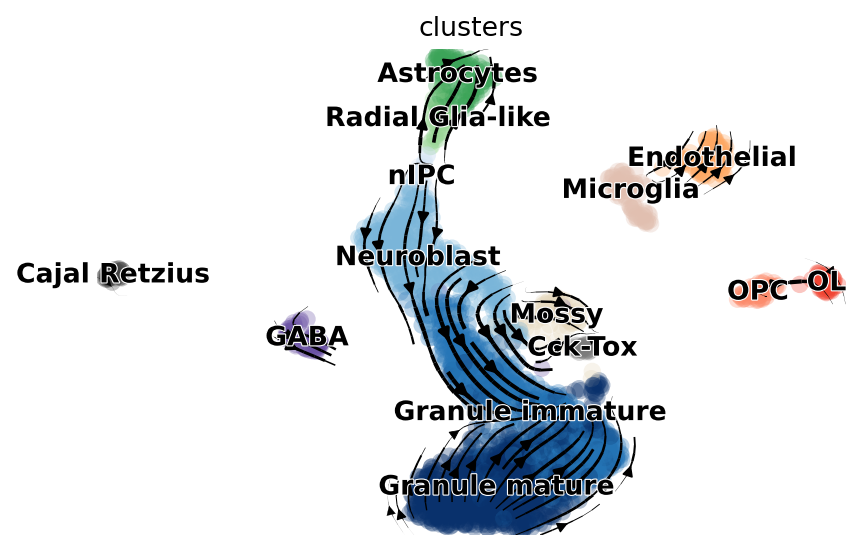

In [27]:
scv.pl.velocity_embedding_stream(dentategyrus, vkey='dynamical_velocity', save='1')

**Analysis**

In the case of this analysis with a provided dataset for which there is a priori knowledge, one can assign cell clusters as is the case above, and the velocities are visualized with arrows, showing developmental trajectories across cell clusters. This is reproducible, so long as the same parameters are set, e.g. the number of top genes, the number of principal components. In the case of non-determinisitc models, e.g. tSNE, reproducibility may be maintained by setting a seed.

saving figure to file ./figures/scvelo_dentate_gyrus_dataset_2.png


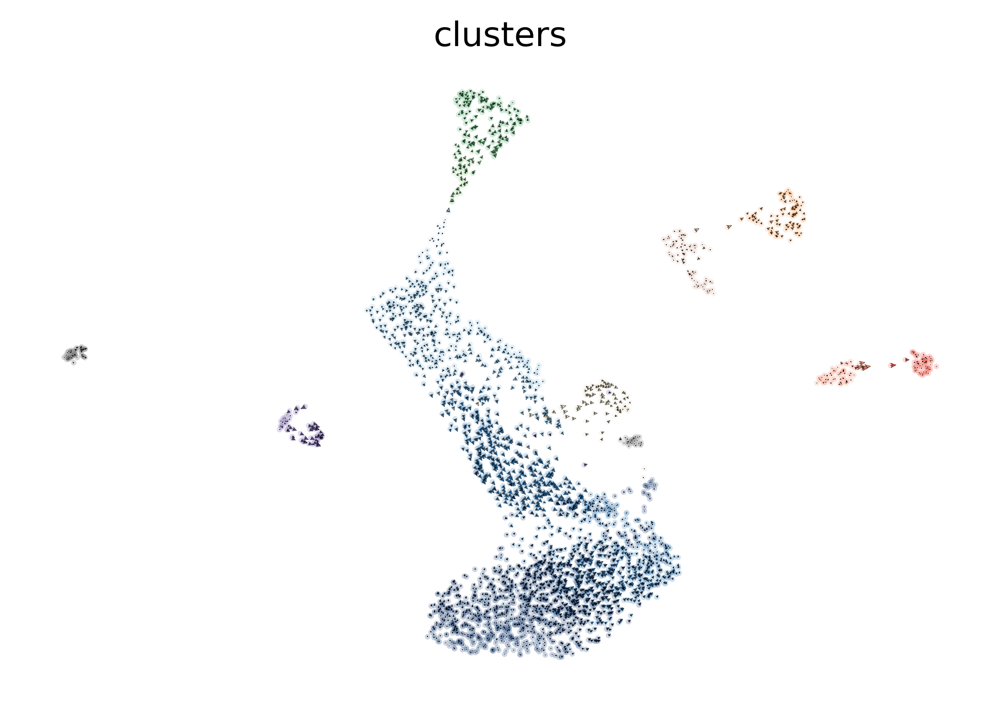

In [28]:
scv.pl.velocity_embedding(dentategyrus, vkey='dynamical_velocity', scale=.7, dpi=200, save='2')

**Analysis**

Above depicts a similar illustration of the cell clusters and each individual cells' RNA velocity, but without cell labels.

Comparing scVelo with a previous method of velocity estimation, velocyto, with comparable parameters as enumerated above

In [29]:
vlm = scv.utils.convert_to_loom(scv.datasets.dentategyrus())

In [30]:
vlm = scv.utils.convert_to_loom(scv.datasets.dentategyrus())

vlm.score_detection_levels(min_expr_counts=20, min_expr_counts_U=20)
vlm.filter_genes(by_detection_levels=True)

vlm.score_cv_vs_mean(2000)
vlm.filter_genes(by_cv_vs_mean=True)

vlm._normalize_S(relative_size=vlm.initial_cell_size, target_size=np.median(vlm.initial_cell_size))
vlm._normalize_U(relative_size=vlm.initial_Ucell_size, target_size=np.median(vlm.initial_Ucell_size))

vlm.S_norm = np.log1p(vlm.S_sz)

vlm.perform_PCA(n_components=30)
vlm.knn_imputation(n_pca_dims=30, k=30)
vlm.normalize_median()

vlm.fit_gammas(fit_offset=False)
#vlm.filter_genes_good_fit()

vlm.predict_U()
vlm.calculate_velocity()
vlm.calculate_shift()
vlm.extrapolate_cell_at_t()

vlm.estimate_transition_prob(hidim='Sx_sz', emebed='ts', transform='sqrt', )
vlm.calculate_embedding_shift(sigma_corr=.05, expression_scaling=False, )

saving figure to file ./figures/scvelo_dentate_gyrus_dataset_3.png


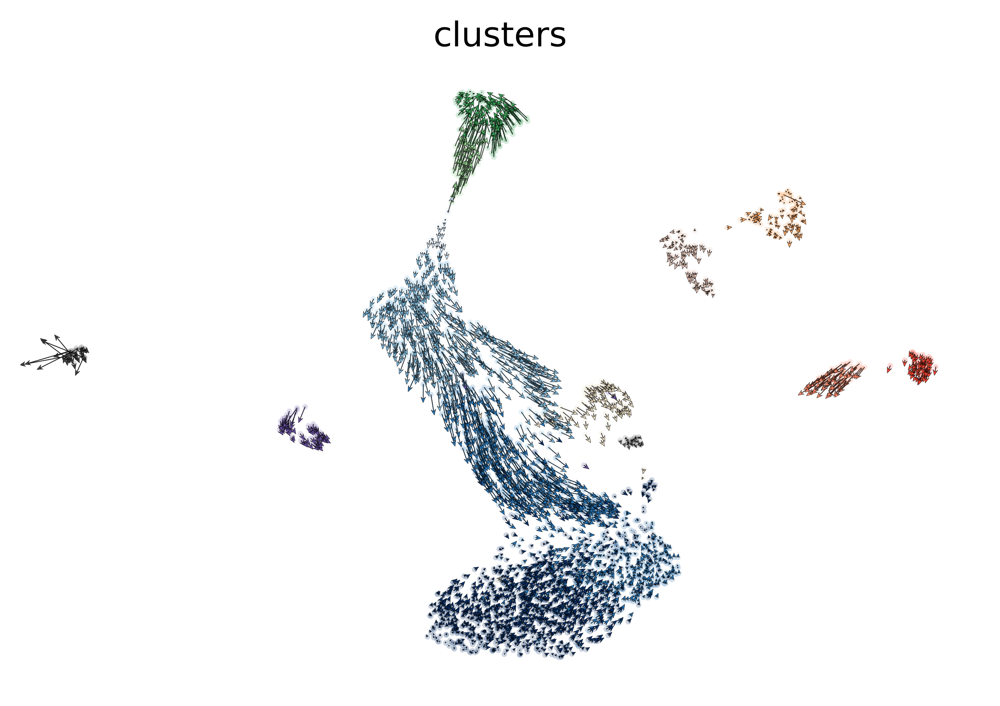

In [31]:
scv.pl.velocity_embedding(dentategyrus, X=vlm.embedding, V=vlm.delta_embedding, frameon=False, dpi=300, save='3')

**Analysis**

In the above plot, we see differences in the older model. The two clusters to the right, for examples, have arrows pointed away from each other righter than towards, implicating a significant biological discrepancy. This is an example of how the choice of model can be so important, and how different choices of models can lead to inconsistent conclusions.

In [32]:
vkey_ss = 'steady_state_velocity'
vkey_sm = 'stochastic_velocity'
vkey_dm = 'dynamical_velocity'

scv.tl.velocity_confidence(dentategyrus, vkey=vkey_ss)
scv.tl.velocity_confidence(dentategyrus, vkey=vkey_sm)
scv.tl.velocity_confidence(dentategyrus, vkey=vkey_dm)

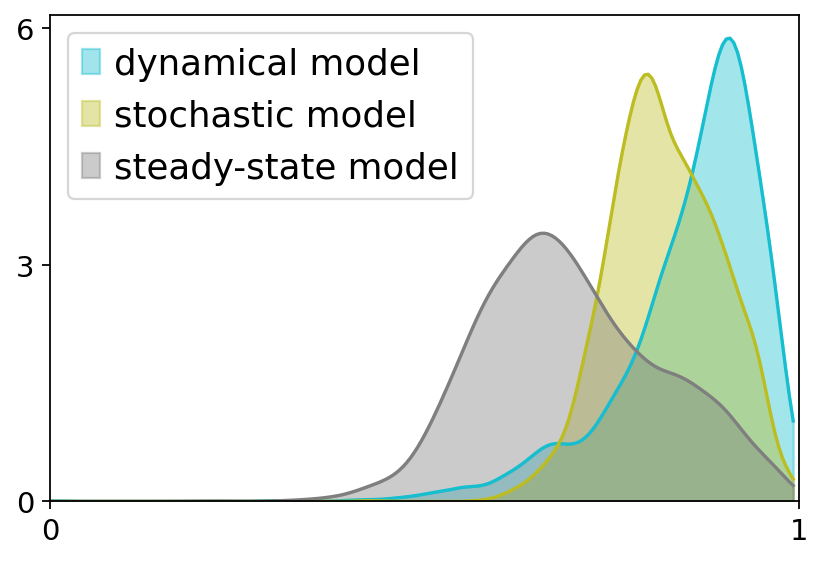

In [33]:
scv.pl.hist([dentategyrus.obs[vkey_dm + '_confidence'].values, 
             dentategyrus.obs[vkey_sm + '_confidence'].values,
             dentategyrus.obs[vkey_ss + '_confidence'].values], 
            labels=['dynamical model', 'stochastic model', 'steady-state model'], kde=True, 
            bins=200, xlim=[0, 1], fontsize=18, legend_fontsize=16)

**Analysis**

On the note of the importance of model selection: the above plot compares computed confidences of velocities across three different methods. The exact methods behind the calculation of this confidence method, however, are not entirely clear.

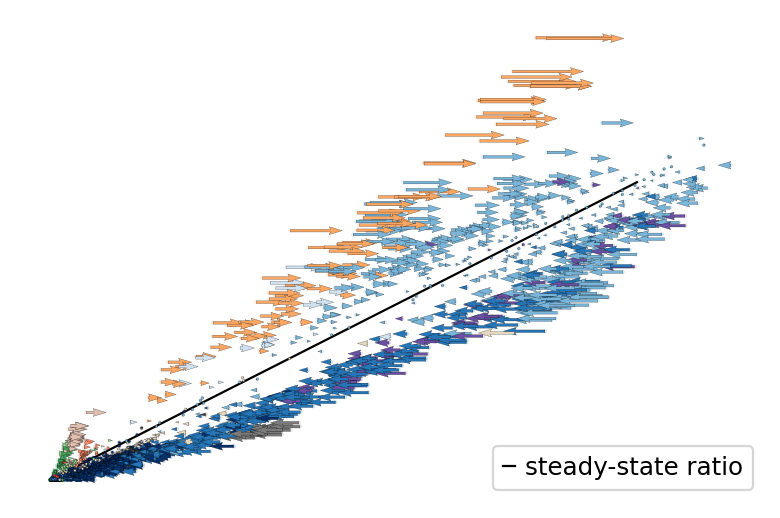

In [34]:
scv.pl.velocity_embedding(dentategyrus, vkey='steady_state_velocity', basis='Tmsb10', 
                          scale=.6, width=.0035, frameon=False, title='')

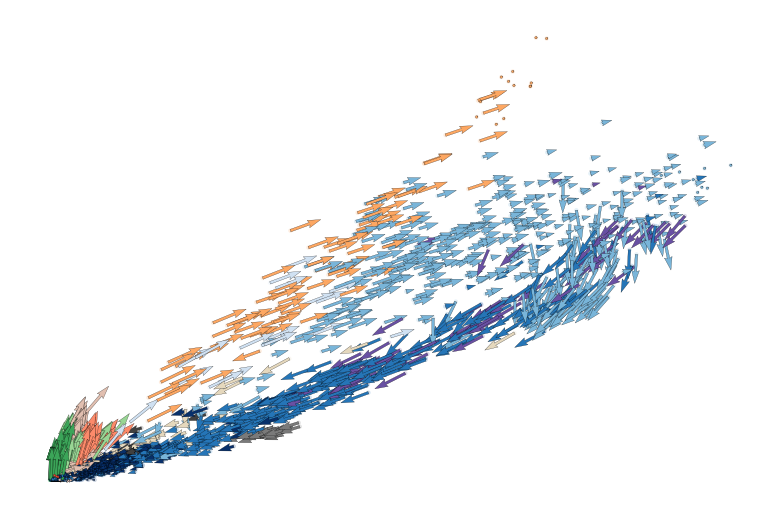

In [35]:
scv.pl.velocity_embedding(dentategyrus, vkey='dynamical_velocity', basis='Tmsb10', scale=4, width=.0035,
                         frameon=False, title='')

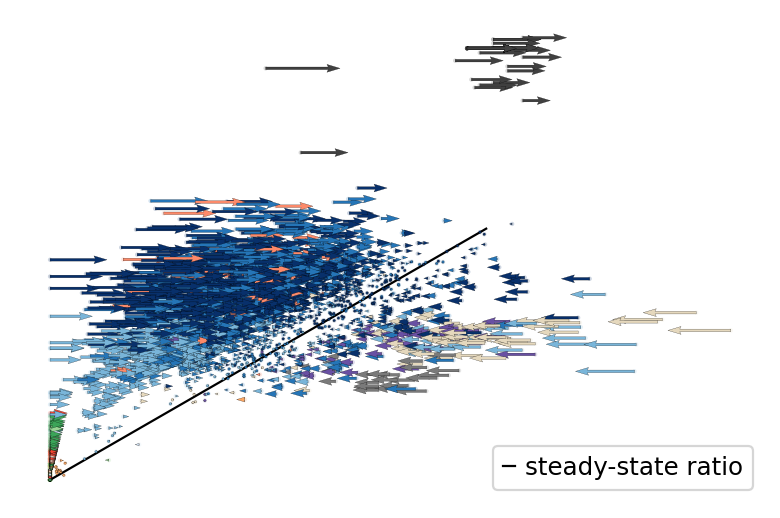

In [36]:
scv.pl.velocity_embedding(dentategyrus, vkey='steady_state_velocity', basis='Fam155a', 
                          scale=60, width=.0035, frameon=False, title='')

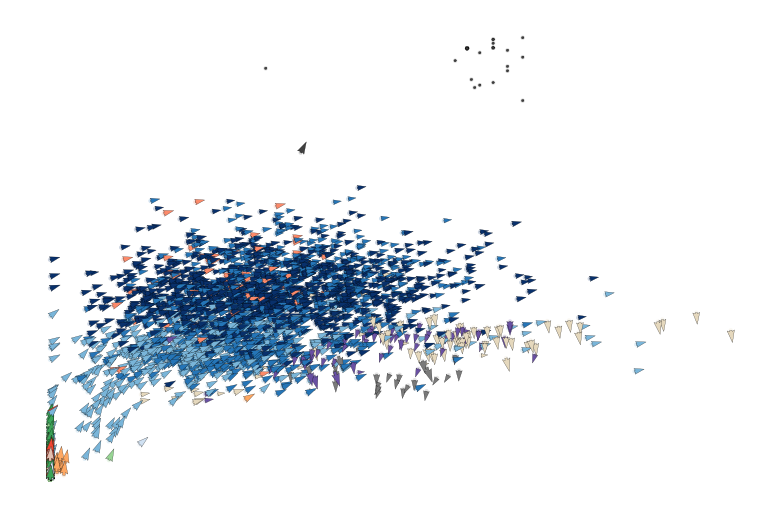

In [37]:
scv.pl.velocity_embedding(dentategyrus, vkey='dynamical_velocity', basis='Fam155a', 
                          scale=3, width=.0035, frameon=False, title='')

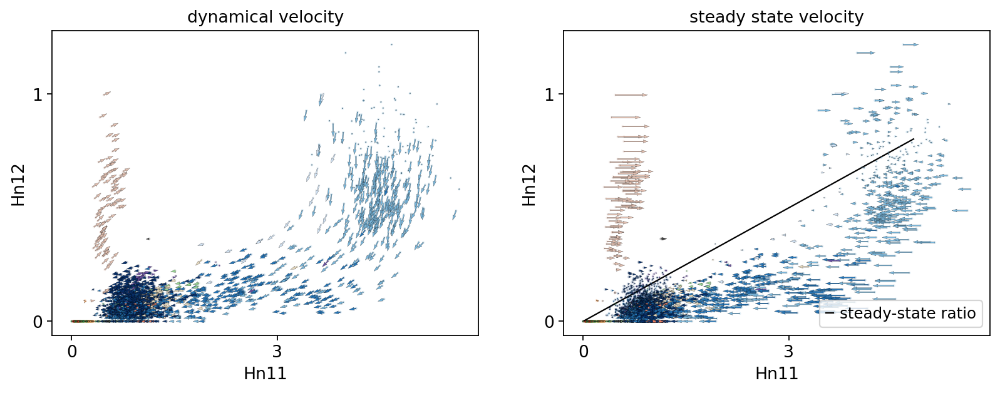

In [38]:
gene = 'Hn1'
scv.pl.velocity_embedding(dentategyrus, basis=gene, vkey=['dynamical_velocity', 'steady_state_velocity'])

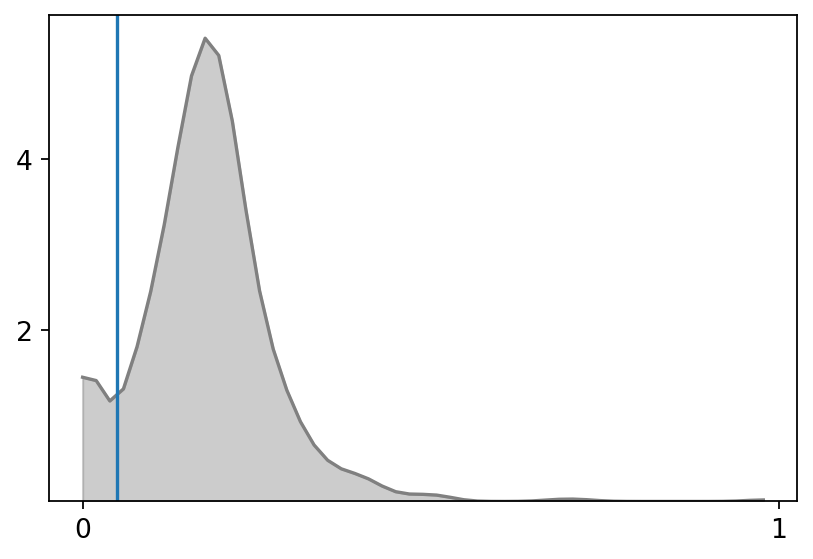

In [39]:
scv.pl.hist(dentategyrus.var['fit_likelihood'], axvline=.05, kde=True, exclude_zeros=True, colors=['grey'])

## Plotting Dynamic Driving Genes and Non-Dynamic Genes Using scvtools Package

In [40]:
utils.recover_dynamics(dentategyrus, ['Tmsb10', 'Ppp3ca', 'Hn1', 'Dlg2'])

recovering dynamics (using 1/8 cores)
    finished (0:00:04)

outputs model fit of gene: Dlg2


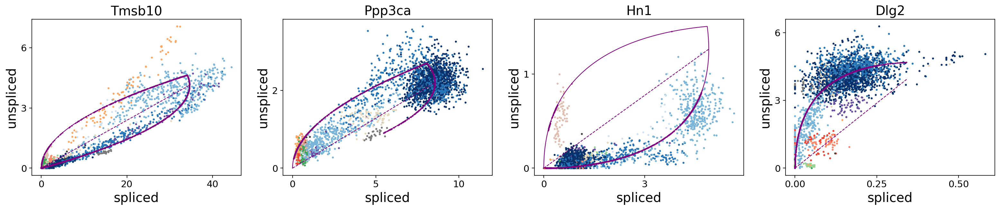

In [41]:
# changed basis by creating a variable and deleting the parameters
basis_dynamic = ['Tmsb10', 'Ppp3ca', 'Hn1', 'Dlg2']
utils.plot_genes(dentategyrus, basis_dynamic)

recovering dynamics (using 1/8 cores)
    finished (0:00:01)

outputs model fit of gene: Tmsb10


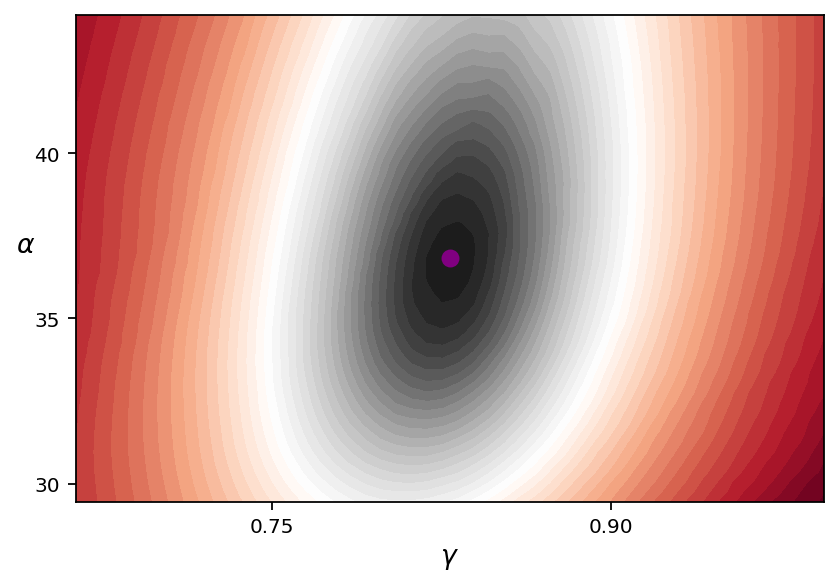

In [42]:
utils.plot_contour(dentategyrus, 'Tmsb10', 100, .2, .2, 0, 50)

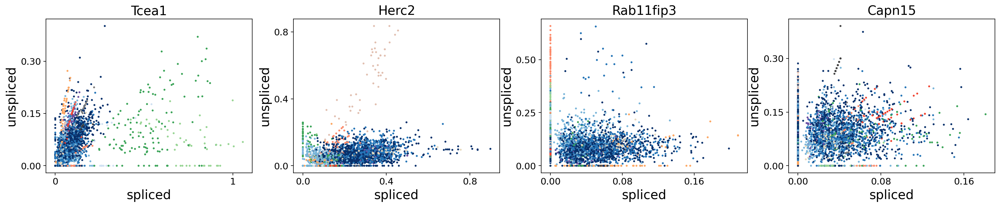

In [43]:
# changed basis by creating a variable and deleting the parameters
basis_non_dynamic = ["Tcea1", "Herc2", "Rab11fip3", "Capn15"]
utils.plot_genes(dentategyrus, basis_non_dynamic)

recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: Tcea1


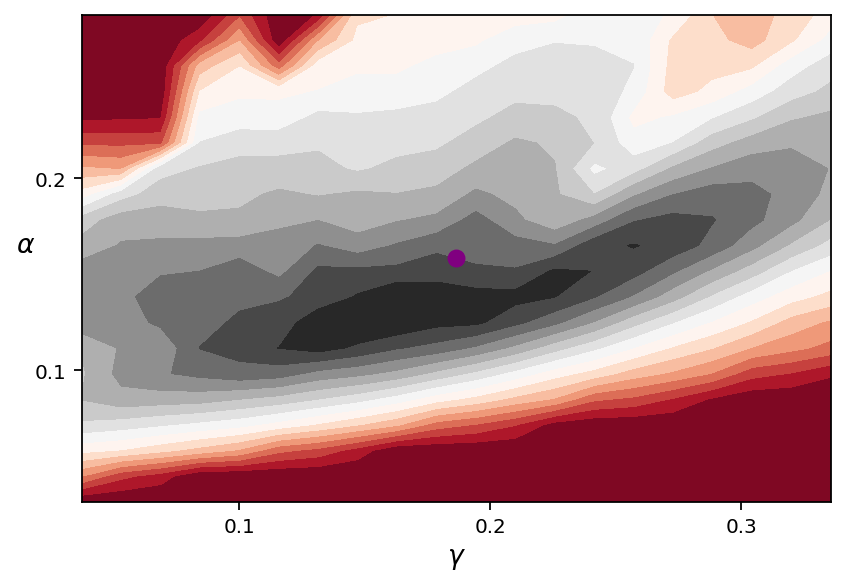

In [44]:
utils.plot_contour(dentategyrus, 'Tcea1', 10, .8, .8, 0, 20)

  0%|          | 0/2930 [00:00<?, ?cells/s]

  0%|          | 0/2930 [00:00<?, ?cells/s]

  0%|          | 0/2930 [00:00<?, ?cells/s]

  0%|          | 0/2930 [00:00<?, ?cells/s]

  0%|          | 0/2930 [00:00<?, ?cells/s]

  0%|          | 0/2930 [00:00<?, ?cells/s]

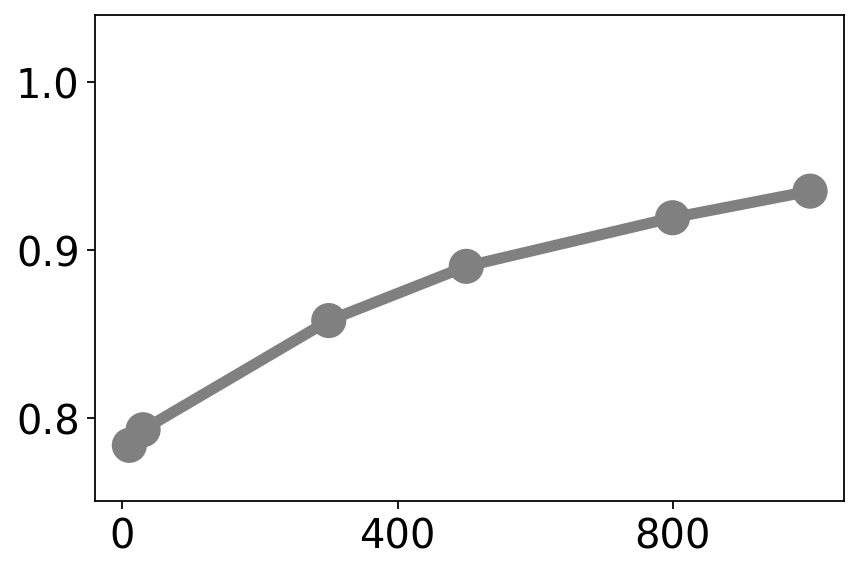

In [45]:
# validation of top likelihood genes
utils.plot_validation_likelihood(dentategyrus)

computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:02)
computing velocity embedding
    finished (0:00:00)


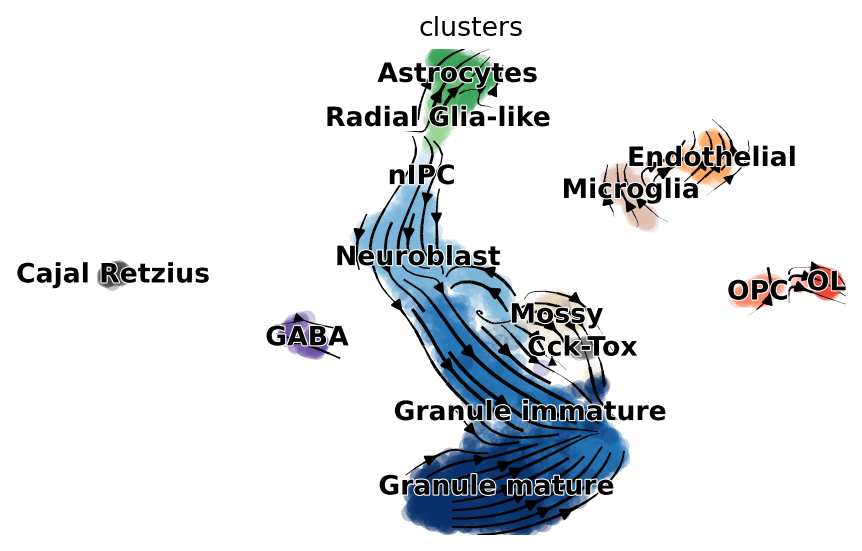

In [46]:
top_genes = dentategyrus.var.sort_values('fit_likelihood', ascending=False).index
sdata = dentategyrus[:, dentategyrus.var_names.isin(top_genes[:10])].copy()
scv.tl.velocity_graph(sdata, vkey='dynamical_velocity')
scv.pl.velocity_embedding_stream(sdata, vkey='dynamical_velocity')

computing velocity graph (using 1/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:09)
computing velocity embedding
    finished (0:00:00)


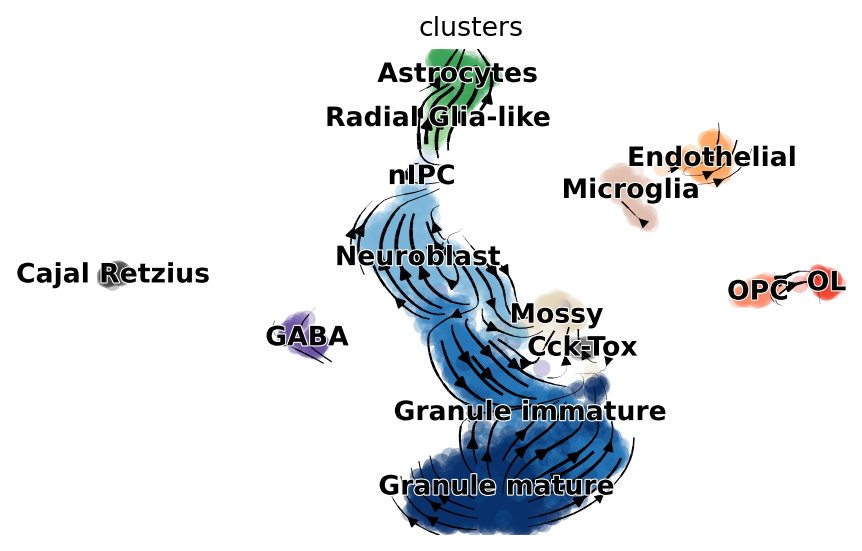

In [47]:
sdata = dentategyrus[:, ~dentategyrus.var_names.isin(top_genes[:30])].copy()
scv.tl.velocity_graph(sdata, vkey='dynamical_velocity')
scv.pl.velocity_embedding_stream(sdata, vkey='dynamical_velocity')

In [48]:
from gprofiler import GProfiler
gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')

neuro_enrichment = gp.profile(query=list(top_genes[:100]), background=list(dentategyrus.var_names),
                              organism='mmusculus', sources=['KEGG'], significance_threshold_method='fdr')

In [49]:
neuro_enrich_results = neuro_enrichment.set_index('native').sort_values('p_value').iloc[:,[2,5,7,10,1]]
neuro_enrich_results.iloc[:100,:]

,p_value,term_size,intersection_size,recall,name
native,,,,,
KEGG:04720,0.002305,32,9,0.281250,Long-term potentiation
KEGG:04024,0.005214,49,10,0.204082,cAMP signaling pathway
KEGG:04724,0.005214,38,9,0.236842,Glutamatergic synapse
KEGG:04020,0.019246,41,8,0.195122,Calcium signaling pathway
KEGG:04713,0.019246,31,7,0.225806,Circadian entrainment
KEGG:05031,0.019246,23,6,0.260870,Amphetamine addiction
KEGG:04080,0.031525,18,5,0.277778,Neuroactive ligand-receptor interaction
KEGG:05033,0.031525,11,4,0.363636,Nicotine addiction
KEGG:05030,0.041725,6,3,0.500000,Cocaine addiction


computing velocity embedding
    finished (0:00:00)


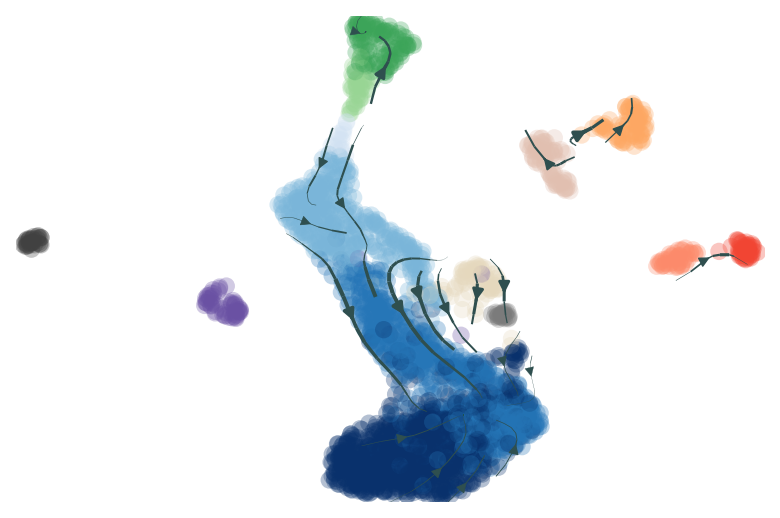

In [50]:
scv.pl.velocity_embedding_stream(dentategyrus, vkey='steady_state_velocity', title='', legend_loc='none', 
                                 alpha=.3, legend_fontsize=12, arrow_color='darkslategrey', 
                                 density=.9, linewidth=1, min_mass=2)

In [51]:
kwargs = {'fontsize': 18, 'size': 80, 'title': '', 
          'legend_loc': 'none', 'colorbar': False, 'frameon': False}
basis = 'Tmsb10'

In [52]:
dm = scv.tl.recover_dynamics(dentategyrus, var_names='Tmsb10')

recovering dynamics (using 1/8 cores)
    finished (0:00:01)

outputs model fit of gene: Tmsb10


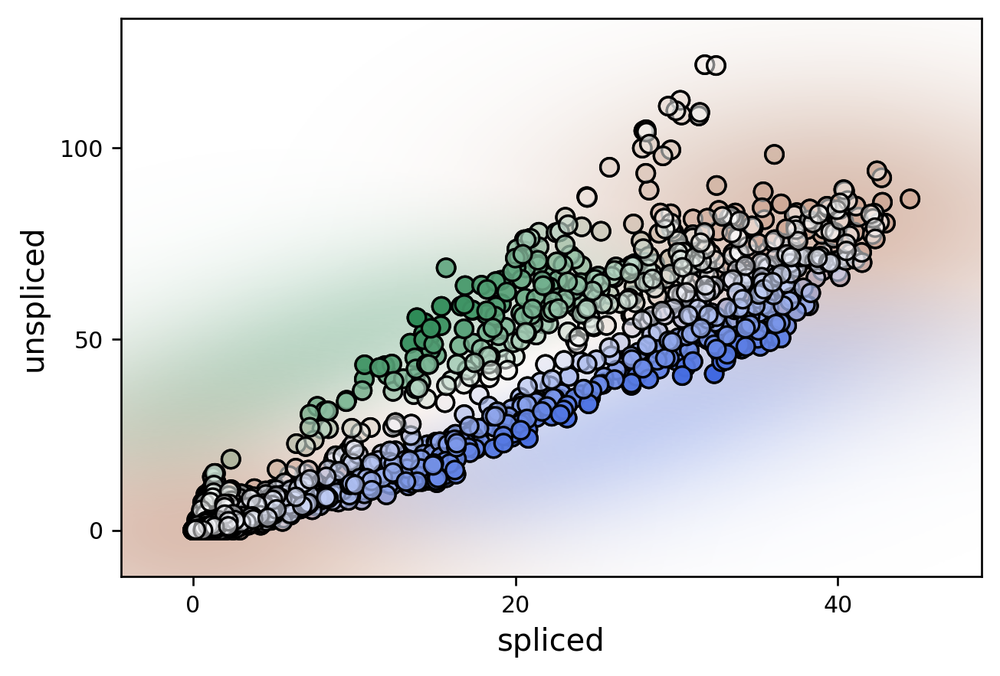

In [54]:
ax = dm.plot_state_likelihoods(var_scale=None, dpi=120)

In [53]:
var_names = ['Tmsb10', 'Ppp3ca', 'Hn1', 'Dlg2']
scv.tl.recover_dynamics(dentategyrus, var_names=var_names)
scv.tl.velocity(dentategyrus, mode='dynamical', vkey='dynamical_velocity', normalized=True)

recovering dynamics (using 1/8 cores)
    finished (0:00:02)

outputs model fit of gene: Dlg2
computing velocities
    finished (0:00:03)


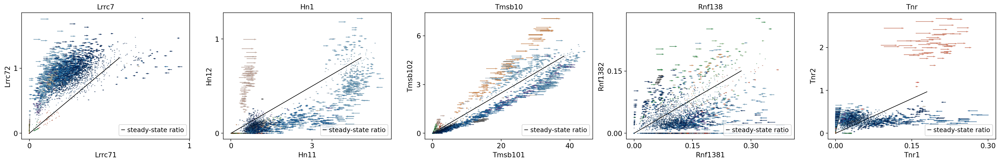

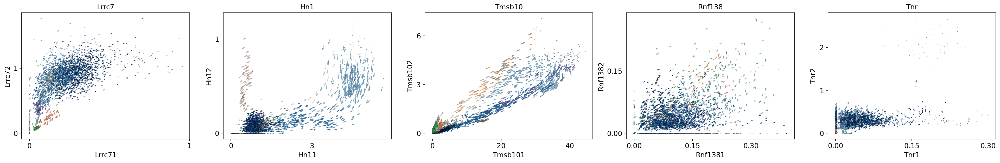

In [55]:
var_names=['Lrrc7', 'Hn1', 'Tmsb10', 'Rnf138', 'Tnr']

scv.pl.velocity_embedding(dentategyrus, basis=var_names, vkey='steady_state_velocity')
scv.pl.velocity_embedding(dentategyrus, basis=var_names, vkey='dynamical_velocity')

recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: Tmsb10


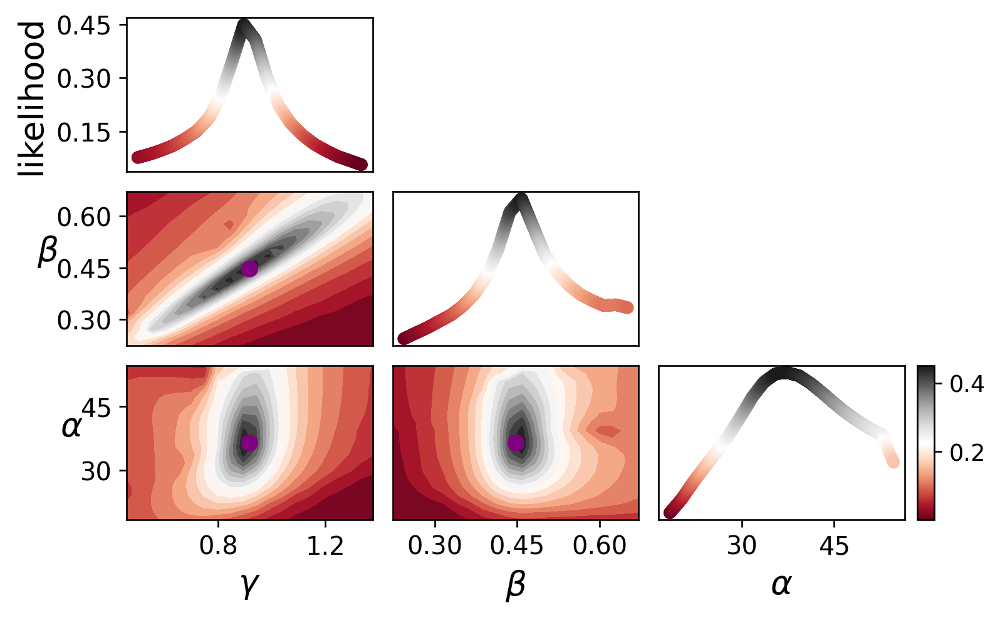

In [56]:
dm = scv.tl.recover_dynamics(dentategyrus, var_names='Tmsb10')
dm.plot_profiles(fontsize=16, dpi=120)

recovering dynamics (using 1/8 cores)
    finished (0:00:00)

outputs model fit of gene: Ppp3ca


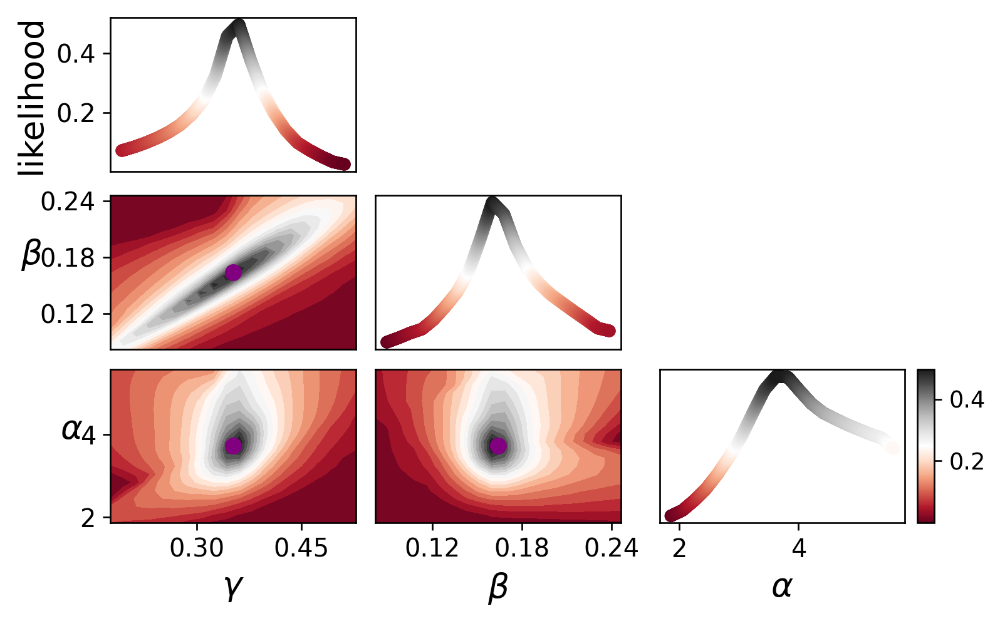

In [57]:
dm = scv.tl.recover_dynamics(dentategyrus, var_names='Ppp3ca')
dm.plot_profiles(fontsize=16, dpi=120)

**Results**